In [1]:
using Plots

<center>
<h1>Field Quantization</h1>
</center>

---
---


### Single mode quantization

We will start by studying a single 1D cavity with infinite walls at $z=0$ and $z=L$, and we will will also asume a polarization of the electric field along the $x$ axis. We would be able to write the fields as:

$$E_x = \sqrt{\frac{2\omega^2}{V \epsilon_0}} q(t) \sin(kz), \quad \quad B_y = \sqrt{\frac{2\omega^2}{Vc}} p(t) \cos(kz)$$

Taking into account that each one of the fields sum up energy, we can write the Hamiltonian of the system as:

$$H = \frac{1}{2}\int\left(\epsilon_0 E_x^2 + \frac{B_y^2}{\mu_0}\right) dV$$

$$H = \frac{1}{2}\int\left(\frac{2\omega^2}{V \epsilon_0} q^2(t) \sin^2(kz) + \frac{2\omega^2}{Vc} p^2(t) \cos^2(kz)\right) dV = \frac{1}{2}\left(\frac{2\omega^2}{V \epsilon_0} q^2(t) + \frac{2\omega^2}{Vc} p^2(t)\right) = \alpha (\omega q^2(t) + p^2(t))$$

Which ends up being a simple quantum harmonic oscillator with a frequency $\omega$ and a coupling constant $\alpha$. We pretty much know everything about this system, so we can write the Hamiltonian in terms of the creation and annihilation operators:

$$H = \alpha (\omega q^2(t) + p^2(t)) = \hbar \omega \left(a^\dagger a + \frac{1}{2}\right)$$

┌ Info: Saved animation to /home/jose/Documents/STUDY/Bsc/Optics/notes/02_field_quantization/quantum_particle_in_box_n1.gif
└ @ Plots /home/jose/.julia/packages/Plots/io9zQ/src/animation.jl:156


Plots.AnimatedGif("/home/jose/Documents/STUDY/Bsc/Optics/notes/02_field_quantization/quantum_particle_in_box_n1.gif")
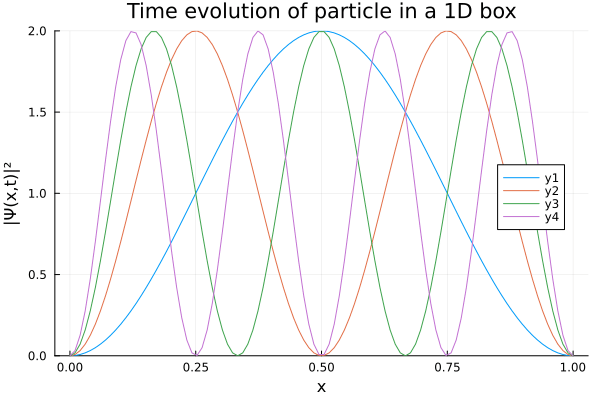

In [2]:
using Plots

L = 1.0  
N = 100  
x = range(0, L, length=N)
dt = 0.01 
timesteps = 0:dt:2π  # time interval

anim = @animate for t in timesteps
    p = plot(title="Time evolution of particle in a 1D box")
    for n in 1:4
        ψ = sqrt(2/L) .* sin.(n .* π .* x ./ L)
        ψ *= cos(n^2 * π^2 * t)
        plot!(x, ψ.^2, ylims=(0, 2/L), legend=n, xlabel="x", ylabel="|Ψ(x,t)|²")
    end
end
n=1
gif(anim, "quantum_particle_in_box_n$(n).gif", fps = 20)

Interestingly, we always solve for the states $\ket{n}$ of the harmonic oscillator, but it is not well defined state of the fields, since the expected value of the field is zero:

$$\bra{n}E_x\ket{n} = \bra{n}\sqrt{\frac{2\omega^2}{V \epsilon_0}} q(t) \sin(kz)\ket{n} = \sqrt{\frac{2\omega^2}{V \epsilon_0}} q(t) \sin(kz) \braket{n} = 0$$

but the expected value of the energy from the field is not zero:

$$\bra{n}E_x^2\ket{n} = \bra{n}\frac{2\omega^2}{V \epsilon_0} q^2(t) \sin^2(kz)\ket{n} = \frac{2\omega^2}{V \epsilon_0} q^2(t) \sin^2(kz) \braket{n} = 2 \epsilon_0^2 \sin^2(kz)\left(n + 1/2\right) \neq 0$$

And using the definition of the variance we obatin:

$$\sigma^2(E_x^2) = \bra{n}E_x^2\ket{n} - \bra{n}E_x\ket{n}^2 = 2 \epsilon_0^2 \sin^2(kz)\left(n + 1/2\right)$$

This is a crazy result, not even in the case when $n=0$ the variance is zero, giving rise to a modified uncertainty principle:

$$\sigma(n) \sigma(E_x) \geq \frac{\epsilon_0}{2} \sin(kz) \|\braket{a^\dagger - a}\|$$

And since the field is what we measure in form of a phase shift, we can say that the uncertainty in the phase shift is bounded by the number of photons in the cavity:

$$ \sigma(n)\sigma(\phi) \geq 1$$

### Multi mode quantization

This treatment can be extended to a multi mode cavity using a 3D box of size $L$ where the fields are such that they satisfy

$$\nabla^2 A = \frac{1}{c^2}\frac{\partial^2 A}{\partial t^2}, \quad E = \dot{A}, \quad B = \nabla \times A$$

And the boundary conditions are such that $A(x,y,z,t) = 0$ for $x=0,L$, $y=0,L$ and $z=0,L$. We can propose a wave number solution of the form:

$$\vec{k} = \frac{w_k}{c} = \frac{2\pi}{L}(m_x,m_y,m_z).$$

However, to account for the independent polarization of the fields, we will have to consider the two possible polarizations of the electric field, and the two possible polarizations of the magnetic field, giving rise to 6 different modes and a differential in the $k$ space of the form:

$$dm = \left(\frac{2L^3}{8\pi^3}\right)dk_x\ dk_y\ dk_z = \left(\frac{2L^3}{8\pi^3}\right) k^2 dk\ d\Omega$$

Where $d\Omega$ is the solid angle, we did this to just make easier to integrate over the $k$ space's solid angle to compute the number of modes in the cavity from $k=0$ to $k+dk$:

$$dN = \left(\frac{2L^3}{8\pi^3}\right) k^2 dk\ d\Omega = \left(\frac{2L^3}{8\pi^3}\right) \frac{4\pi k^2}{(2\pi/L)^3} dk = \frac{L^3}{\pi^2} k^2 dk = L^3 \rho_k dk$$

Where $\rho_k$ is the density of modes in the cavity. We can now compute the energy of the field in the cavity, and we obtain the hamiltonian: 

$$\hat H = \sum_k \hbar \omega_k \left(a_k^\dagger a_k + \frac{1}{2}\right)$$

Where $\omega_k = ck$ and $a_k^\dagger$ and $a_k$ are the creation and annihilation operators for the mode $k$. This has to be an eigenstate of the system:

$$\hat H |n_1,n_2,\dots,n_k\rangle = E |n_1,n_2,\dots,n_k\rangle$$

In the case of the free  field, we can get straight to the solutions of the fields, which are:

$$\vec E = i \sum_{ks} \sqrt{\frac{\hbar \omega_k}{2\epsilon_0 V}} \left(a_k e^{i\vec k \cdot \vec r} - a_k^\dagger e^{-i\vec k \cdot \vec r}\right) \vec e_s$$
$$ = E^+ + E^-$$

Where $E^+$ and $E^-$ are a simple rephrasing of the equation above, such that: 

$$E^+ = i \sum_{ks} \sqrt{\frac{\hbar \omega_k}{2\epsilon_0 V}} a_k e^{i\vec k \cdot \vec r} \vec e_s, \quad \quad  E^- = (E^+)^\dagger$$

Notice that if we are dealing with visible light, the wavelength is of the order of $10^{-6}$ meters, and thus:

$$\frac{1}{k} \sim 10^{-6} \text{m}\gg a_{Bohr}$$

Which means that the field's dependence of $r$ can be almost ignored, and we can say that the field is constant in space, and thus the field is:

$$\vec E = i \sqrt{\frac{\hbar \omega_k}{2\epsilon_0 V}} E_x (\hat a e^{-i\omega t} - \hat a^\dagger e^{i\omega t})$$

Where $\hat a$ and $\hat a^\dagger$ are the annihilation and creation operators for the field, and $\vec e_s$ is the polarization of the field. We can now compute the energy of the field:

In [9]:
using LinearAlgebra
using FFTW

L = 5.0 
N = 100 
T = 10.0   
dt = 0.01  
x = range(-L/2, stop=L/2, length=N)

x0 = 0.0    # Initial position
k0 = 0.0    # Initial momentum
sigma = 0.5 # Width of the Gaussian packet
ψx = exp.(-(x .- x0).^2 / (2*sigma^2)) .* exp.(im * k0 * x) 
plan = plan_fft(ψx, flags=FFTW.MEASURE)
expHk = exp.(-im * (2π/L)^2 * (0:N÷2-1).^2 * dt)
anim = @animate for t in range(0, stop=T, step=dt)
    global ψx
    ψx .*= exp.(-im * x.^2 * dt) # position space part
    ψk = plan * ψx # to momentum space
    ψk[1:N÷2] .*= expHk # momentum space part
    ψx = inv(plan) * ψk # back to position space
    ψx .*= exp.(-im * x.^2 * dt) # position space part again
    prob_density = abs2.(ψx)
    prob_density3D = prob_density * prob_density'
    plot(x, x, prob_density3D, st=:surface, color=:inferno, clim=(0,1), legend=false)
end
gif(anim, "particle_in_box.gif", fps = 25)

## Thermal Fields

We should think about the relation between what we have done so far and the thermal fields, which is what motivated Planck. Lets think of a 1D mode field with the walls at temerature $T$. We can introduce the density operator:

$$\rho_T = \frac{e^{-\beta \hat H}}{\text{Tr}\left(e^{-\beta \hat H}\right)}$$

Here we call $Z = \text{Tr}\left(e^{-\beta \hat H}\right)$ the partition function. We can now compute the average number of photons in the cavity:

$$\langle n \rangle= \bra{n}n\rho_T\ket{n} = \frac{e^{-\hbar \omega / k_B T}}{1 - e^{-\hbar \omega / k_B T}} = \frac{1}{e^{\hbar \omega / k_B T} - 1}$$

So we see that at room temperature, the average number of photons is of the order of $10^{-6}$, which is a very small number, but we can see that as the temperature increases, the number of photons increases exponentially. We can also rewrite the density operator as:

$$\rho_T = \frac{1}{1 + \langle n \rangle} \sum_{n=0}^\infty \left(\frac{\langle n \rangle}{1 + \langle n \rangle}\right)^n \ket{n}\bra{n}$$

And thus, the probability of having $n$ photons in the cavity is:


$$P(n) = \frac{\langle n \rangle^n}{(1 + \langle n \rangle)^{n+1}}$$

This is the Bose-Einstein distribution that reflects the quantum statistics of identical, non-interacting bosons, such as photons. Let us see how the average number of photons changes:


┌ Info: Saved animation to /home/jose/Documents/STUDY/Bsc/Optics/notes/02_field_quantization/probabilities.gif
└ @ Plots /home/jose/.julia/packages/Plots/io9zQ/src/animation.jl:156


Plots.AnimatedGif("/home/jose/Documents/STUDY/Bsc/Optics/notes/02_field_quantization/probabilities.gif")
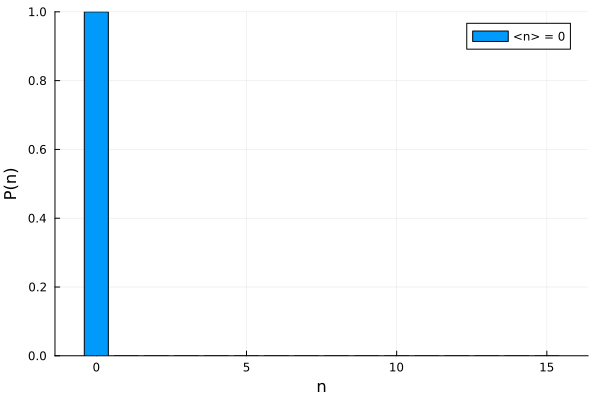

In [4]:
P_tn(n, n_bar) = (n_bar^n) / ((1 + n_bar) ^ (n+1))

anim = @animate for n_bar in 0:15
    bar(0:15, P_tn.(0:15, n_bar), label="<n> = $n_bar", ylims=(0,1), xlabel="n", ylabel="P(n)")
end
gif(anim, "probabilities.gif", fps = 5)


Furthermore, we can compute the variance in the photon number, which gives a measure of the fluctuations around the mean value $\langle n \rangle$:

$$\langle n^2 \rangle  = \text{Tr}(n^2 \rho_T) = \frac{e^{-\hbar \omega / k_B T}}{1 - e^{-\hbar \omega / k_B T}} + \frac{e^{-2\hbar \omega / k

_B T}}{(1 - e^{-\hbar \omega / k_B T})^2}$$

This leads to the standard deviation:

$$\Delta n = \sqrt{\langle n^2 \rangle - \langle n \rangle^2} = \sqrt{\bar n + \bar n^2} \approx \bar n + 1/2$$

This expression shows that the fluctuations in the photon number increase with the average number of photons.

### The Total Radiation and Its Approximations

Let's now consider the total energy of the radiation field, which can be estimated by taking the expected number of photons and multiplying by the energy of each photon in the $\omega$ state:

$$\bar U = \hbar \omega \rho(\omega) \bar n = \frac{\hbar \omega^3}{\pi^2 c^3} \frac{1}{e^{\hbar \omega / k_B T} - 1} $$

In this context, we can introduce two different approximations depending on the relative magnitudes of $\hbar \omega$ and $k_B T$:

- If $\hbar \omega \ll k_B T$, we get the Rayleigh-Jeans law: 

$$\bar U = \frac{\omega^3}{\pi^2 c^3} k_B T$$

This result, derived from classical physics, predicts an infinite total energy for the radiation field, leading to the aforementioned "ultraviolet catastrophe". 

- If $\hbar \omega \gg k_B T$, we get Wien's law:

$$\bar U = \frac{\hbar \omega^3}{\pi^2 c^3} e^{-\hbar \omega / k_B T}$$

This approximation is applicable at high frequencies (or equivalently, short wavelengths) and correctly predicts the exponential decay of energy with frequency, observed experimentally.

Finally, to get the total energy density, we integrate $\bar U$ over all frequencies, yielding the Stefan-Boltzmann law:

$$U = \int_0^\infty \bar U d\omega = \frac{\hbar}{\pi^2 c^3} \int_0^\infty \frac{\omega^3 d\omega}{e^{\hbar \omega / k_B T} - 1} = \frac{\pi^2}{15} \frac{k_B^4 T^4}{(\hbar c)^3}.$$

This law, which gives the total energy density of the radiation field as a function of temperature, underscores the quintessential success of Planck's quantum hypothesis in resolving the dilemmas of classical physics. 



### Zero Point Energy

We have seen that even for energy $0$ at the state $n=0$, we have a non-zero energy, specially at low temperatures. This is called the zero point energy. And this would make the total energy of the field infinite, which is not good. In fact, this accounts for several phenomena such as the Casimir effect.

For the ZPE, we can compute the average energy of the field:

$$\left(\frac{8\pi \nu^2 d\nu V}{c^3}\right ) = \frac{1}{8\pi}\int_V (E_\nu^2 + B_\nu^2) dV = \frac{E_\nu^2V}{8\pi}$$

Where $E_\nu$ and $B_\nu$ are the electric and magnetic fields. Lets now think of a perturbation by changing the volume of the cavity by $dV$. We can compute the work done by the field:

$$\Delta E = \langle nlm_l | \langle \Delta V \rangle | nlm_l \rangle = \frac{\langle \Delta r^2 \rangle}{6}\langle nlm_l | \langle \nabla^2 V \rangle | nlm_l \rangle$$

Where $\langle \Delta r^2 \rangle$ is the average change in the radius of the cavity. We can see that for $s$ states ($l=0$) the expected value of the radius does not change. This, the shift only comes from the $\langle \Delta r^2 \rangle$ term, and the energy difference calculation is straightforward.

### The quantum phase

In the classical case, we have seen that the field of a single mode is:

$$\vec E = E_x \cos(\omega t - k z) \hat i$$

We are going to define the phase of the field as:

$$e^i \hat \phi = \sum_{n=0}^\infty |n\rangle \langle n+1|$$

But to actually be able to use $\phi$ as a phase, we'll have to make it periodic, which can be done via a simple trick: $\Phi(\phi) = \Phi(\phi + P)$, where $P$ is the period. We can now compute the average value of the phase. A equivalent and cleaner way to do this is to use the operators:

$$\hat C = \frac{E + E^\dagger}{2}, \quad \quad \hat S = \frac{E - E^\dagger}{2i}$$

were

$$E = \sum_{n=0}^\infty |n\rangle \langle n+1|, \quad \quad E^\dagger = \sum_{n=0}^\infty |n+1\rangle \langle n|.$$

What is really interesting is that $C \sim \cos(\phi)$ and $S \sim \sin(\phi)$. Using this we can inspect the the uncertanties for $n\ge 1$:

$$\Delta C = \Delta S = \frac{1}{\sqrt 2}.$$


#### References

ch2. of Quantum Optics by Gerry and Knight